<h1>Содержание<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><ul class="toc-item"><li><span><a href="#Технологический-процесс" data-toc-modified-id="Технологический-процесс-0.1"><span class="toc-item-num">0.1&nbsp;&nbsp;</span>Технологический процесс</a></span></li></ul></li><li><span><a href="#Подготовка-данных" data-toc-modified-id="Подготовка-данных-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Подготовка данных</a></span></li><li><span><a href="#Анализ-данных" data-toc-modified-id="Анализ-данных-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Анализ данных</a></span></li><li><span><a href="#Модель" data-toc-modified-id="Модель-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Модель</a></span></li><li><span><a href="#Итоговый-вывод" data-toc-modified-id="Итоговый-вывод-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Итоговый вывод</a></span></li><li><span><a href="#Чек-лист-готовности-проекта" data-toc-modified-id="Чек-лист-готовности-проекта-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Чек-лист готовности проекта</a></span></li></ul></div>

# Восстановление золота из руды

Подготовьте прототип модели машинного обучения для «Цифры». Компания разрабатывает решения для эффективной работы промышленных предприятий.

Модель должна предсказать коэффициент восстановления золота из золотосодержащей руды. Используйте данные с параметрами добычи и очистки. 

Модель поможет оптимизировать производство, чтобы не запускать предприятие с убыточными характеристиками.

Вам нужно:

1. Подготовить данные;
2. Провести исследовательский анализ данных;
3. Построить и обучить модель.

Чтобы выполнить проект, обращайтесь к библиотекам *pandas*, *matplotlib* и *sklearn.* Вам поможет их документация.

### Технологический процесс

![](https://pictures.s3.yandex.net/resources/viruchka_1576238830.jpg)

Как золото получают из руды? Когда добытая руда проходит первичную обработку, получается дроблёная смесь. Её отправляют на флотацию (обогащение) и двухэтапную очистку.

**Опишем каждую стадию:**
1. Флотация

Во флотационную установку подаётся смесь золотосодержащей руды. После обогащения получается черновой концентрат и «отвальные хвосты», то есть остатки продукта с низкой концентрацией ценных металлов.
На стабильность этого процесса влияет непостоянное и неоптимальное физико-химическое состояние флотационной пульпы (смеси твёрдых частиц и жидкости).

2. Очистка 

Черновой концентрат проходит две очистки. На выходе получается финальный концентрат и новые отвальные хвосты.

**Описание данных**

Технологический процесс:
- Rougher feed — исходное сырье
- Rougher additions (или reagent additions) — флотационные реагенты: Xanthate, Sulphate, Depressant
- Xanthate — ксантогенат (промотер, или активатор флотации);
- Sulphate — сульфат (на данном производстве сульфид натрия);
- Depressant — депрессант (силикат натрия).
- Rougher process (англ. «грубый процесс») — флотация
- Rougher tails — отвальные хвосты
- Float banks — флотационная установка
- Cleaner process — очистка
- Rougher Au — черновой концентрат золота
- Final Au — финальный концентрат золота
Параметры этапов:
- air amount — объём воздуха
- fluid levels — уровень жидкости
- feed size — размер гранул сырья
- feed rate — скорость подачи

**Наименование признаков**

Наименование признаков должно быть такое:

[этап].[тип_параметра].[название_параметра]

Пример: rougher.input.feed_ag

Возможные значения для блока [этап]:
- rougher — флотация
- primary_cleaner — первичная очистка
- secondary_cleaner — вторичная очистка
- final — финальные характеристики
Возможные значения для блока [тип_параметра]:
- input — параметры сырья
- output — параметры продукта
- state — параметры, характеризующие текущее состояние этапа
- calculation — расчётные характеристики

**Расчёт эффективности**

Вам нужно смоделировать процесс восстановления золота из золотосодержащей руды.
Для прогноза коэффициента нужно найти долю золота в концентратах и хвостах. Причём важен не только финальный продукт, но и черновой концентрат.

**Метрика качества**

Для решения задачи введём новую метрику качества — sMAPE (англ. Symmetric Mean Absolute Percentage Error, «симметричное среднее абсолютное процентное отклонение»).
Она похожа на MAE, но выражается не в абсолютных величинах, а в относительных. Почему симметричная? Она одинаково учитывает масштаб и целевого признака, и предсказания.

Эффективность обогащения рассчитывается по формуле

![](https://pictures.s3.yandex.net/resources/Recovery_1576238822.jpg)

- C — доля золота в концентрате после флотации/очистки;
- F — доля золота в сырье/концентрате до флотации/очистки;
- T — доля золота в отвальных хвостах после флотации/очистки.

Нужно спрогнозировать сразу две величины:
- эффективность обогащения чернового концентрата rougher.output.recovery;
- эффективность обогащения финального концентрата final.output.recovery.

Итоговая метрика складывается из двух величин

**Описание проекта**

Данные находятся в трёх файлах:

- gold_industry_train.csv — обучающая выборка;
- gold_industry_test.csv — тестовая выборка;
- gold_industry_full.csv — исходные данные.

Данные индексируются датой и временем получения информации (признак date). Соседние по времени параметры часто похожи.
Некоторые параметры недоступны, потому что замеряются и/или рассчитываются значительно позже. Из-за этого в тестовой выборке отсутствуют некоторые признаки, которые могут быть в обучающей. Также в тестовом наборе нет целевых признаков.
Исходный датасет содержит обучающую и тестовую выборки со всеми признаками.
В вашем распоряжении сырые данные: их просто выгрузили из хранилища. Прежде чем приступить к построению модели, проверьте по нашей инструкции их на корректность.

**Этапы выполнения проекта**
1. Подготовим данные
Откроем файлы и изучим их.
Путь к файлам:

-- /datasets/gold_industry_train.csv. Скачать датасет

-- /datasets/gold_industry_test.csv. Скачать датасет

-- /datasets/gold_industry_full.csv. Скачать датасет

- Проверим, что эффективность обогащения рассчитана правильно. Вычислим её на обучающей выборке для признака rougher.output.recovery. Найдите MAE между нашими расчётами и значением признака. Опишем выводы.
- Проанализируем признаки, недоступные в тестовой выборке. Что это за параметры? К какому типу относятся?
- Проведем предобработку данных.

2. Проанализируем данные
- Посмотрим, как меняется концентрация металлов (Au, Ag, Pb) на различных этапах: в сырье, в черновом концентрате, в концентрате после первой очистки и в финальном концентрате. Какие особенности имеют распределения? Напишем выводы.
- Сравним распределения размеров гранул исходного сырья на обучающей и тестовой выборках. Если распределения сильно отличаются друг от друга, оценка модели будет неправильной.
- Исследуем суммарную концентрацию металлов на разных стадиях: в сырье, в черновом концентрате, в концентрате после первой очистки и в финальном концентрате.

3. Построим модель
- Напишем функцию для вычисления итоговой sMAPE.
- Обучим разные модели и оценим их качество кросс-валидацией. Выберем лучшую модель и проверим её на тестовой выборке. Опишем выводы.
Нам пригодятся формулы метрик качества:
- формула sMAPE
![](https://i.postimg.cc/hvy89Nfd/smape-1576239058.jpg)
- формула итогового sMAPE
![](https://i.postimg.cc/vmFrLrH3/final-smape-1576239054.jpg)

## Подготовка данных

In [1]:
# Импортируем необходимые модули
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.pipeline import Pipeline, FeatureUnion
from tqdm import tqdm_notebook, tqdm
from plotly import graph_objects as go
from sklearn.model_selection import train_test_split
from sklearn.pipeline import  make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, make_scorer
from sklearn.model_selection import GridSearchCV
from sklearn.dummy import DummyRegressor

warnings.filterwarnings("ignore")

In [2]:
# Снимем ограничение на количество столбцов
pd.set_option('display.max_columns', None)

# Снимем ограничение на ширину столбцов
pd.set_option('display.max_colwidth', None)

# Игнорируем предупреждения
pd.set_option('chained_assignment', None)

In [3]:
# Загрузим данные
try:
    test = pd.read_csv('/datasets/gold_industry_test.csv')
    train = pd.read_csv('/datasets/gold_industry_train.csv')
    full = pd.read_csv('/datasets/gold_industry_full.csv')
except:
    test = pd.read_csv('gold_industry_test.csv')
    train = pd.read_csv('gold_industry_train.csv')
    full = pd.read_csv('gold_industry_full.csv')

In [4]:
# Напишем общую функцию для отображения информации о загруженных данных
def loaded_data_func(data):
    print(f'Данные датасета {data}:')
    print()
    print(data.head(3))
    print()
    print('Информация датасета:')
    print(data.info())
    print()
    print('Описание датасета:')
    print(data.describe())
    print()
    print(f'Количествово пропусков:{data.isna().sum()[data.isna().sum()!=0].sort_values(ascending=False)}') 
    print()
    print(f'Количествово дубликатов:{data.duplicated().sum()}')
    print()
    print('Уникальные значения датасета:')
    print(data.nunique())
    print()
    corr_matrix = data.corr()
    print(corr_matrix)
    fig, ax = plt.subplots(figsize=(50, 40))
    sns.heatmap(corr_matrix, annot=True, cmap="Spectral")
    ax.set(title='Тепловая карта')

    data.hist(figsize=(50, 40), bins=100, color='green')
    plt.title('Количество добываемой нефти в скважинах региона')
    plt.xlabel('Количество скважин региона')
    plt.ylabel('Количество добываемой нефти')
    plt.show();

Отобразим информацию по трем датасетам. Каждая секция будет выполняться примерно минуту.

Данные датасета                      date  rougher.input.feed_au  rougher.input.feed_ag  \
0     2017-12-09 14:59:59               4.365491               6.158718   
1     2017-12-09 15:59:59               4.362781               6.048130   
2     2017-12-09 16:59:59               5.081681               6.082745   
3     2017-12-09 17:59:59               5.145949               6.084374   
4     2017-12-09 18:59:59               5.735249               6.165220   
...                   ...                    ...                    ...   
4855  2018-08-18 06:59:59               6.620245               5.992592   
4856  2018-08-18 07:59:59               6.741324               6.158617   
4857  2018-08-18 08:59:59               6.627458               6.015149   
4858  2018-08-18 09:59:59               6.702243               6.097592   
4859  2018-08-18 10:59:59               6.633002               5.908793   

      rougher.input.feed_pb  rougher.input.feed_sol  rougher.input.feed_rate  \
0  

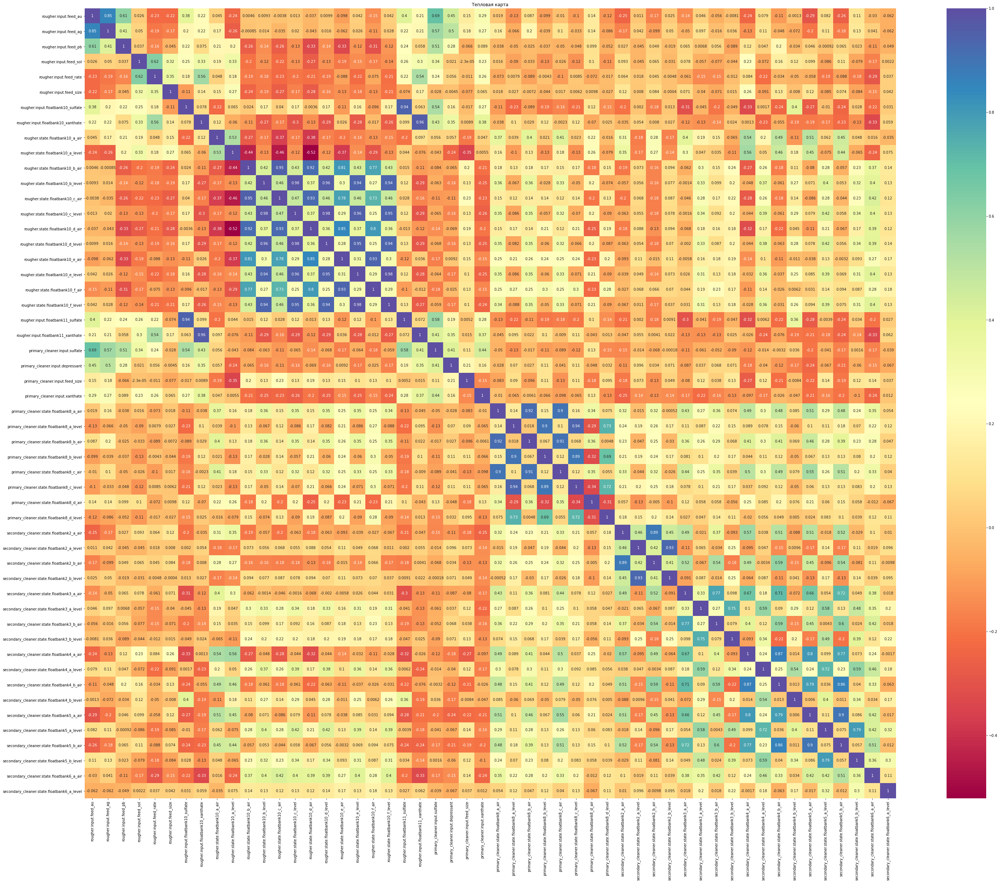

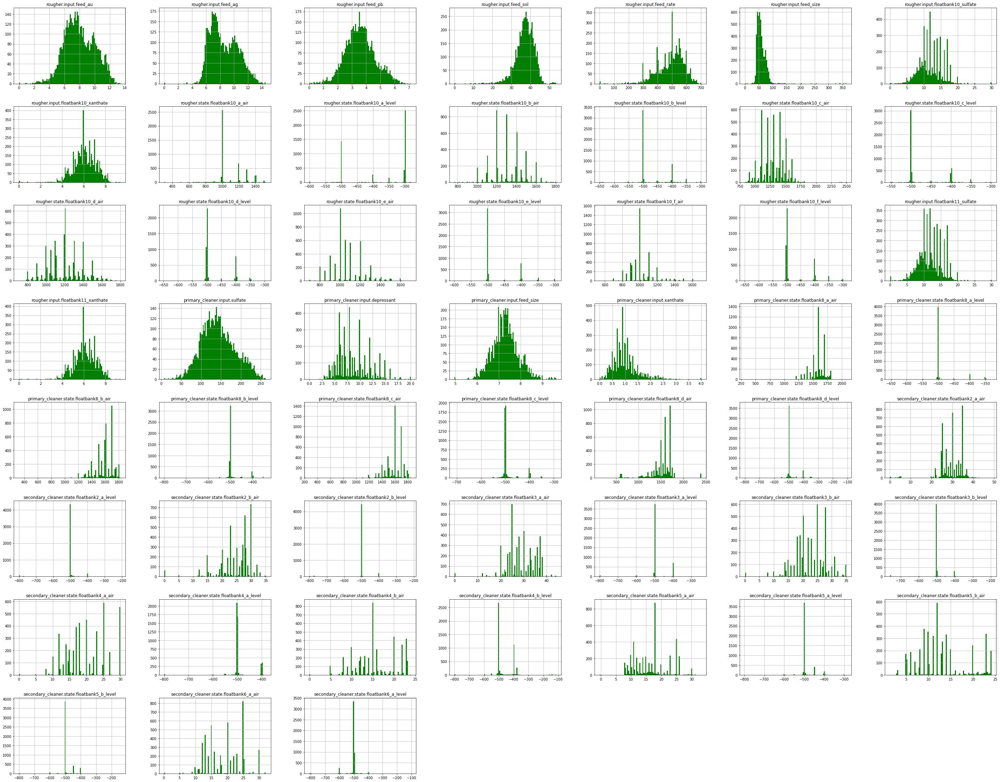

In [5]:
loaded_data_func(test)

Данные датасета                       date  rougher.input.feed_au  rougher.input.feed_ag  \
0      2016-01-15 00:00:00               6.486150               6.100378   
1      2016-01-15 01:00:00               6.478583               6.161113   
2      2016-01-15 02:00:00               6.362222               6.116455   
3      2016-01-15 03:00:00               6.118189               6.043309   
4      2016-01-15 04:00:00               5.663707               6.060915   
...                    ...                    ...                    ...   
14574  2017-12-09 09:59:59               4.599524               5.822083   
14575  2017-12-09 10:59:59               4.658125               5.844800   
14576  2017-12-09 11:59:59               5.335862               6.091855   
14577  2017-12-09 12:59:59               4.838619               6.121323   
14578  2017-12-09 13:59:59               4.525061               5.970515   

       rougher.input.feed_pb  rougher.input.feed_sol  rougher.input.fee

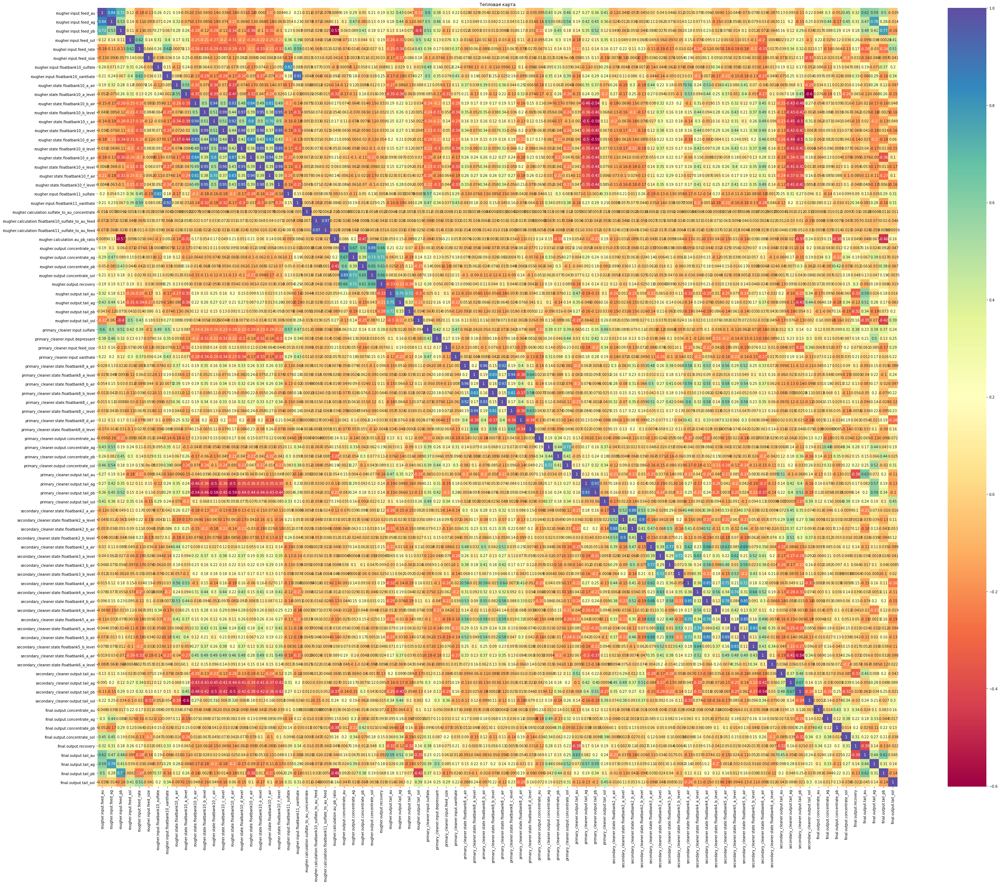

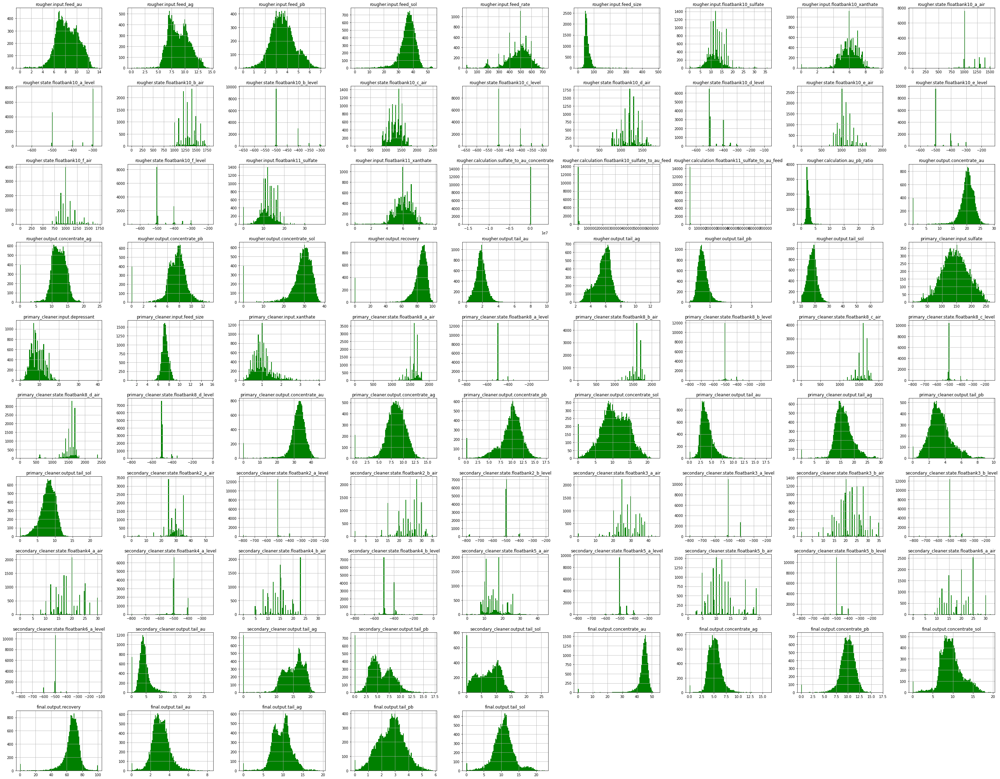

In [6]:
loaded_data_func(train)

Данные датасета                       date  rougher.input.feed_au  rougher.input.feed_ag  \
0      2016-01-15 00:00:00               6.486150               6.100378   
1      2016-01-15 01:00:00               6.478583               6.161113   
2      2016-01-15 02:00:00               6.362222               6.116455   
3      2016-01-15 03:00:00               6.118189               6.043309   
4      2016-01-15 04:00:00               5.663707               6.060915   
...                    ...                    ...                    ...   
19434  2018-08-18 06:59:59               6.620245               5.992592   
19435  2018-08-18 07:59:59               6.741324               6.158617   
19436  2018-08-18 08:59:59               6.627458               6.015149   
19437  2018-08-18 09:59:59               6.702243               6.097592   
19438  2018-08-18 10:59:59               6.633002               5.908793   

       rougher.input.feed_pb  rougher.input.feed_sol  rougher.input.fee

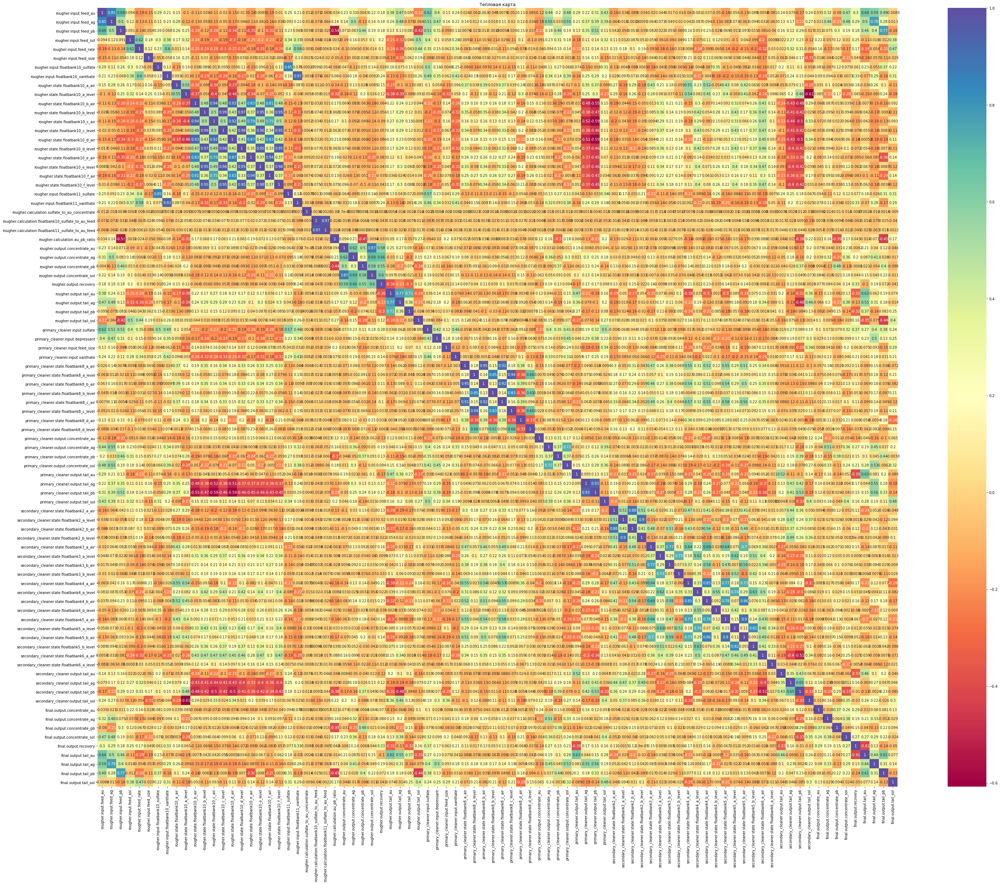

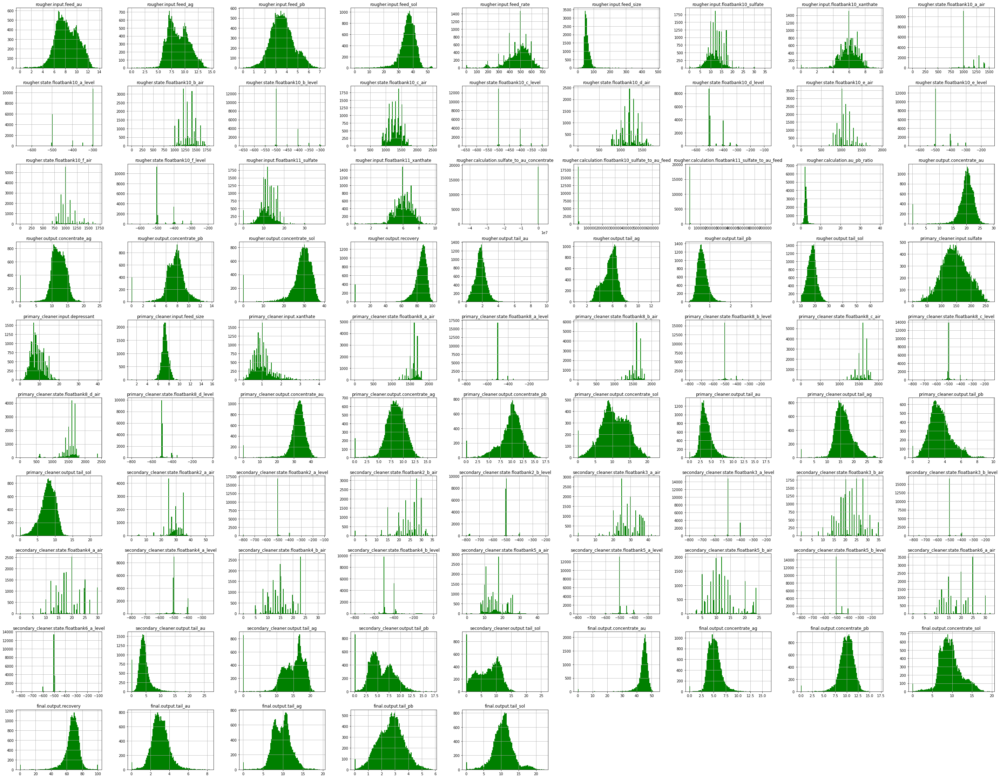

In [7]:
loaded_data_func(full)

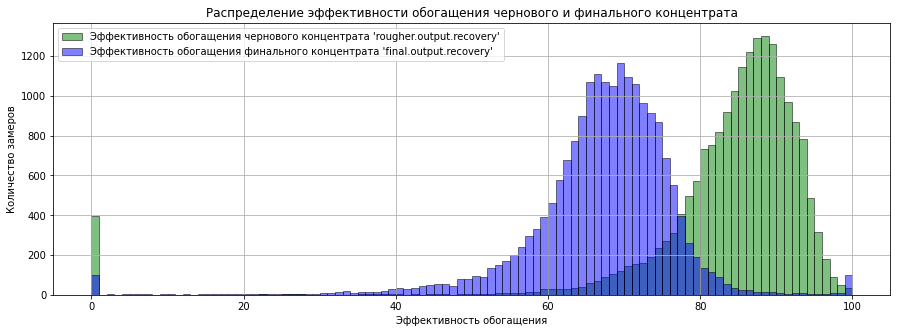

In [8]:
# Отдельно отобразим распределение целевых признаков
full['rougher.output.recovery'].hist(figsize=(15, 5), alpha=0.5, bins=100, color='green', edgecolor = 'black')
full['final.output.recovery'].hist(figsize=(15, 5), alpha=0.5, bins=100, color='blue', edgecolor = 'black')
plt.grid(True)
plt.legend(["Эффективность обогащения чернового концентрата 'rougher.output.recovery'", 
            "Эффективность обогащения финального концентрата 'final.output.recovery'"])
plt.xlabel('Эффективность обогащения')
plt.ylabel('Количество замеров')
plt.title('Распределение эффективности обогащения чернового и финального концентрата')
plt.show()

Проверим формулу вычисления эффективности обогащения:

$$
recovery = {{С\cdot{(F-T)} \over F\cdot{(C-T)}}} \cdot 100%
$$  

где:

- C — доля золота в концентрате после флотации/очистки (rougher.output.concentrate_au);
- F — доля золота в сырье/концентрате до флотации/очистки (rougher.input.feed_au);
- T — доля золота в отвальных хвостах после флотации/очистки (rougher.output.tail_au).

Результат работы формулы находится здесь: rougher.output.recovery
Проверим, что эффективность обогащения рассчитана правильно. Вычислим её на обучающей выборке для признака rougher.output.recovery. Найдем MAE между нашими расчётами и значением признака.
Среднее абсолютное отклонение `MAE` для линейной регрессии рассчитывается так:  

`mae` = `mean_absolute_error`(`target_valid`, `predicted_valid`)

In [9]:
# Избавимся от пропусков в столбцах со значением NaN
train.dropna(subset=['rougher.output.concentrate_au', 'rougher.input.feed_au',
                                   'rougher.output.tail_au','rougher.output.recovery'], inplace=True)

In [10]:
old_recovery = train['rougher.output.recovery']
C = train['rougher.output.concentrate_au']
F = train['rougher.input.feed_au']
T = train['rougher.output.tail_au']

In [11]:
recovery = ((C * (F - T)) / (F * (C - T))) * 100

In [12]:
# Посчитаем MAE и посмотрим на среднее абсолютное отклонение.
print('MAE:', mean_absolute_error(old_recovery, recovery))

MAE: 9.83758577644259e-15


МАЕ мало, различий между данными нет, считаем, что рассчеты верны.

In [13]:
# Проанализируем те признаки, которые недоступны в тестовой выборке
unavailable_features = train.columns.drop(test.columns)
train[unavailable_features].head().T

,0,1,2,3,4
rougher.calculation.sulfate_to_au_concentrate,41885.707031,42050.861809,42018.101184,42029.447991,42125.354245
rougher.calculation.floatbank10_sulfate_to_au_feed,3481.779053,3498.370979,3495.348910,3498.578313,3494.800771
rougher.calculation.floatbank11_sulfate_to_au_feed,3520.337158,3489.981857,3502.359819,3499.162912,3506.679315
rougher.calculation.au_pb_ratio,2.838687,2.858998,2.945989,3.002340,3.169615
rougher.output.concentrate_au,19.793808,20.050975,19.737170,19.320810,19.216101
rougher.output.concentrate_ag,11.500771,11.615865,11.695753,11.915047,12.411054
rougher.output.concentrate_pb,7.101074,7.278807,7.216833,7.175616,7.240205
rougher.output.concentrate_sol,28.029297,28.067063,27.454037,27.341277,27.041023
rougher.output.recovery,87.107763,86.843261,86.842308,87.226430,86.688794
rougher.output.tail_au,1.170244,1.184827,1.162562,1.079755,1.012642


Эти признаки - это концентрация различных веществ на выходе после отчистки, а также доля веществ в отвальных хвостах.

In [14]:
# Уберем из обучающей выборки ненужные признаки
drop_cols = unavailable_features.drop(['final.output.recovery', 'rougher.output.recovery'])
right_cols = train.columns.drop(drop_cols)
train = train[right_cols]

Добавим целевые признаки в тестовую выборку. Используем значения столбца date как индексы, чтобы объединить датасеты и добавить в тестовую выборку недостающую информацию.

In [15]:
features_to_join = full[['date', 'final.output.recovery', 'rougher.output.recovery']].copy()
test = test.join(features_to_join.set_index('date'), on='date')
train['final.output.recovery'].isnull().value_counts()

False    14579
Name: final.output.recovery, dtype: int64

In [16]:
# Проверим есть ли пропуски
print(train['final.output.recovery'].isnull().value_counts())
print(train['rougher.output.recovery'].isnull().value_counts())
print(test['final.output.recovery'].isnull().value_counts())
print(test['rougher.output.recovery'].isnull().value_counts())

False    14579
Name: final.output.recovery, dtype: int64
False    14579
Name: rougher.output.recovery, dtype: int64
False    4860
Name: final.output.recovery, dtype: int64
False    4860
Name: rougher.output.recovery, dtype: int64


In [17]:
# Избавимся от значений NaN в целевых признаках обеих выборок
train.dropna(subset = ['final.output.recovery', 'rougher.output.recovery'], inplace = True)
test.dropna(subset = ['final.output.recovery', 'rougher.output.recovery'], inplace = True)

In [18]:
# Сбросим индексы
test.reset_index(drop=True, inplace=True)
train.reset_index(drop=True, inplace=True)

In [19]:
# Проверим размер датасетов
print(train.shape)
print(test.shape)

(14579, 55)
(4860, 55)


In [20]:
# Заполним оставшиеся пропуски соседними непропущенными значениями (из условия "соседние по времени параметры часто похожи")
train = train.fillna(method='bfill')
test = test.fillna(method='bfill')
train.isna().values.any(), test.isna().values.any()

(False, False)

Теперь мы имеем train и test, состоящие из необходимых столбцов и очищенные от наблюдений с пропусками в целевых признаках.

**Итог:**

- Файл открыт, данные загружены.
- Во всех таблицах есть пропуски.
- За исключением столбца date, все признаки имеют тип float. 
- Дубликатов не обнаружено.
- Типы данных не требуют преобразования.
- Информация о выходных значениях, которая отсутствует в test, присутсвует в full, поэтому возможно тестовые данные были предобработаны до предоставления нам.
- Целевые признаки - rougher.output.recovery и final.output.recovery.
- Количество строк в train и test в сумме дают размер full, поэтому вероятно полный датафрейм был разделен на них на этапе выгрузки данных. 
- Параметры указывающие объём воздуха, уровень жидкости, размер гранул сырья, скорость подачи на разных этапах имеют диапазоны значений измеряемые сотнями и тысячами едениц. Еденицы других параметров измеряются еденицами и десятками.
- Распределение признаков разнообразно, все они, кроме столбца date, являются количественными. 
- Целевые признаки имеют отрицательную асимметрию и не следуют какому-либо стандартному закону.
- Корреляционный анализ показал, что между некоторыми признаками существует сильная зависимость, связанная с концентрациями металлов в руде, применением реагентов и последовательными технологическими процессами. 
- Значение метрики МАЕ рассчитаное на данных полного датафрейма стремится к нулю, что говорит об использовании правильной формулы для расчёта эффективности обогащения
- Пропуски в данных заменены ближайщими предыдущими значениями.

Предобработка данных завершена. Можем приступать к анализу.

## Анализ данных

**Проанализируем концентрацию металлов (Au, Ag, Pb) на различных этапах очистки**

rougher.input.feed_au: 13
rougher.output.concentrate_au: 28
primary_cleaner.output.concentrate_au: 45
final.output.concentrate_au: 52
rougher.input.feed_ag: 14
rougher.output.concentrate_ag: 24
primary_cleaner.output.concentrate_ag: 16
final.output.concentrate_ag: 16
rougher.input.feed_pb: 7
rougher.output.concentrate_pb: 13
primary_cleaner.output.concentrate_pb: 17
final.output.concentrate_pb: 17
rougher.input.feed_sol: 53
rougher.output.concentrate_sol: 38
primary_cleaner.output.concentrate_sol: 22
final.output.concentrate_sol: 19


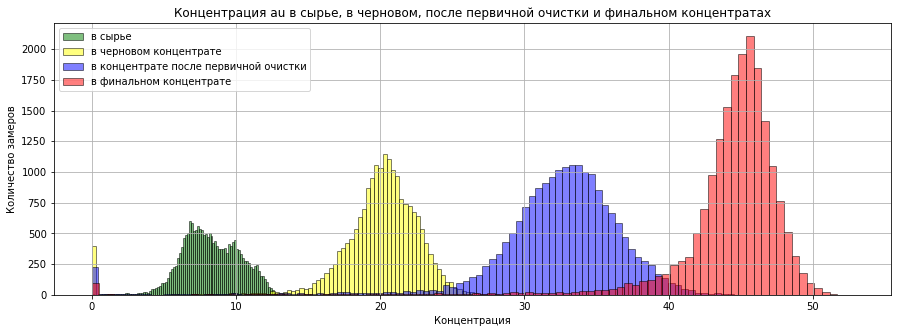

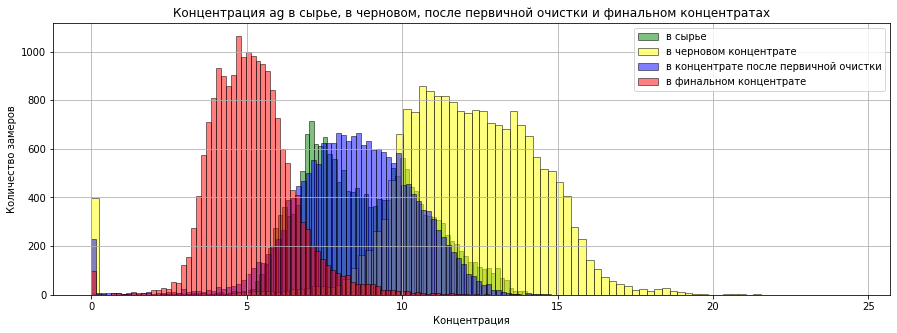

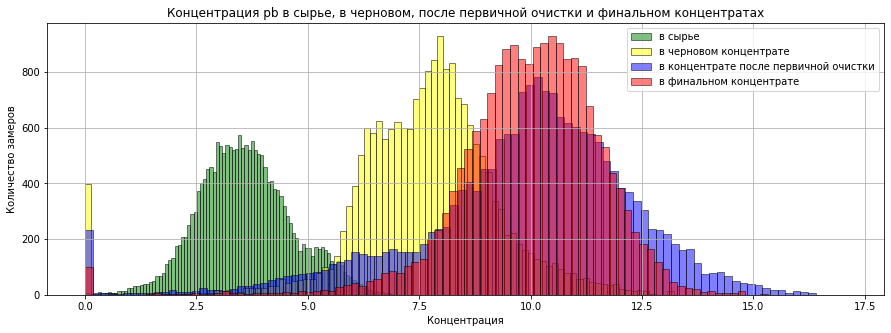

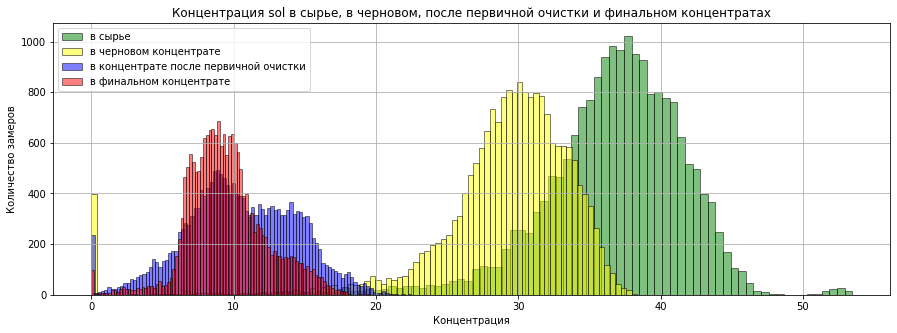

In [21]:
# Отобразим гистограммы для распределения концентраций всех металлов на различных этапах очистки
metals = ['au', 'ag', 'pb', 'sol']
phases = [
    'rougher.input.feed_',
    'rougher.output.concentrate_',
    'primary_cleaner.output.concentrate_',
    'final.output.concentrate_',
]

for metal in metals:
    max_concentration = 0
    fig, ax = plt.subplots(figsize=(15, 5))
    ax.grid(True)
    ax.set_title(f'Концентрация {metal} в сырье, в черновом, после первичной очистки и финальном концентратах')
    ax.set_xlabel('Концентрация')
    ax.set_ylabel('Количество замеров')
    
    colors = ['green', 'yellow', 'blue', 'red'] 
    i = 0
    for phase in phases:
        concentration = full[f'{phase}{metal}']
        ax.hist(concentration, bins=100, alpha=0.5, edgecolor='black', color=colors[i])
        ax.legend(['в сырье', 'в черновом концентрате', 
                    'в концентрате после первичной очистки', 'в финальном концентрате'])
        max_concentraition = max(max_concentration, int(concentration.max()))
        print(f'{phase}{metal}:', max_concentraition)
        i += 1

Видим, что с каждым этапом увеличивается концентрация золота (примерно в 5 раз) и свинца (примерно в 3 раза), а концентрация серебра наоборот уменьшается. Это возможно связано с самой технологие добычи металла. Возможно, необходимо орзанизовать дополнительную обработку отвальных пород с выделением серебра, что может принести дополнительную прибыль. То же самое можно сказать и о sol, хотя не совсем понятно что это. Судя по записям в интернете это может быть соль или раствор.

**Сравненим распределения размеров гранул сырья на обучающей и тестовой выборках**

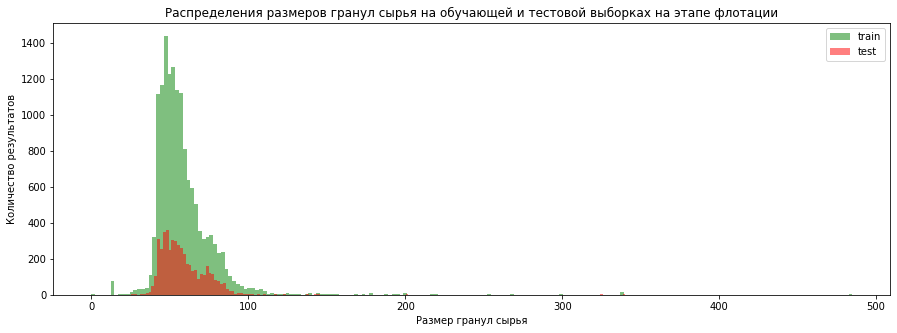

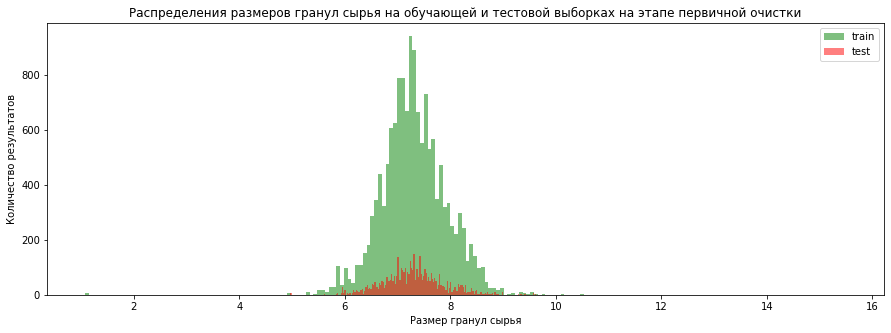

In [22]:
# Отобразим гистограммы для распределения размеров гранул сырья на различных этапах
titles = ['Распределения размеров гранул сырья на обучающей и тестовой выборках на этапе флотации', 
          'Распределения размеров гранул сырья на обучающей и тестовой выборках на этапе первичной очистки']
datasets1 = [train['rougher.input.feed_size'], train['primary_cleaner.input.feed_size']]
datasets2 = [test['rougher.input.feed_size'], test['primary_cleaner.input.feed_size']]

for i in range(2):
    plt.rcParams['figure.figsize'] = (15, 5)
    plt.hist(datasets1[i], color='green', bins=200, label='train', alpha=0.5)
    plt.hist(datasets2[i], color='red', bins=200, label='test', alpha=0.5)
    plt.legend(loc='upper right')
    plt.title(titles[i])
    plt.xlabel("Размер гранул сырья")
    plt.ylabel("Количество результатов")
    plt.show()
    i += 1

Для большей наглядности посмотрим графики распределений

Видим, что на этапе флотации размеры гранул в train до 55, в test до 45. А вот на этапе первичной очистки размеры гранул в train и test находятся в диапазоне 7,5-7,7. Распределение размеров гранул на этапе первичной очистки похоже на нормальное - гранулы примерно одного размера.

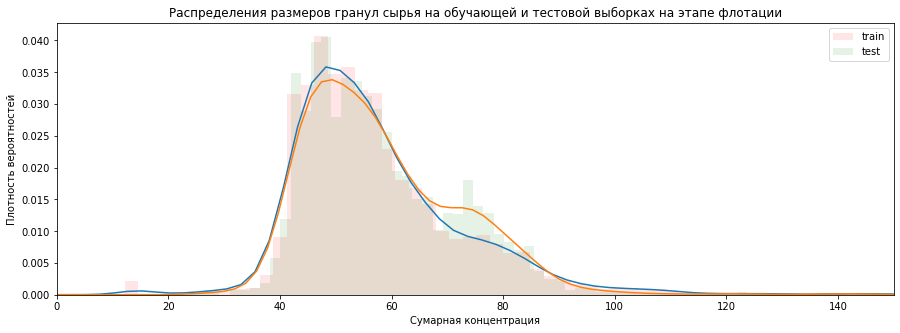

In [23]:
# Для сравнения распределений выборок с разным размером используем kde
plt.rcParams['figure.figsize'] = (15, 5)
ax = sns.distplot(a=train['rougher.input.feed_size'], label='train', hist=True, kde=True, rug=False, 
                  bins=200, hist_kws={"color":"red", "alpha":0.1})
bx = sns.distplot(a=test['rougher.input.feed_size'], label='test', hist=True, kde=True, rug=False, 
                  bins=200, hist_kws={"color":"green", "alpha":0.1})
ax.set_xlim(0, 150)
bx.set_xlim(0, 150)
plt.legend(loc='upper right')
plt.title('Распределения размеров гранул сырья на обучающей и тестовой выборках на этапе флотации')
plt.xlabel("Размер гранул сырья")
plt.ylabel("Плотность")
plt.show()

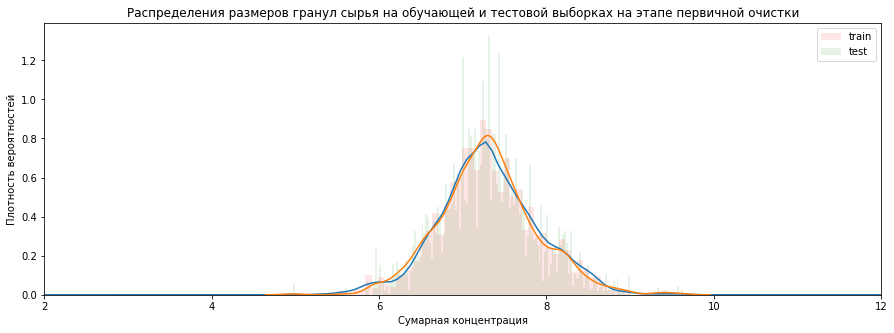

In [24]:
# Для сравнения распределений выборок с разным размером используем kde
plt.rcParams['figure.figsize'] = (15, 5)
ax = sns.distplot(a=train['primary_cleaner.input.feed_size'], label='train', hist=True, kde=True, rug=False, 
                  bins=200, hist_kws={"color":"red", "alpha":0.1})
bx = sns.distplot(a=test['primary_cleaner.input.feed_size'], label='test', hist=True, kde=True, rug=False, 
                  bins=200, hist_kws={"color":"green", "alpha":0.1})
ax.set_xlim(2, 12)
bx.set_xlim(2, 12)
plt.legend(loc='upper right')
plt.title('Распределения размеров гранул сырья на обучающей и тестовой выборках на этапе первичной очистки')
plt.xlabel("Размер гранул сырья")
plt.ylabel("Плотность")
plt.show()

**Исследуем суммарную концентрацию веществ на разных стадиях**

In [25]:
# Построим таблицу суммарных концентраций всех материалов в обучающей выборке на разных стадиях
total_concentration = pd.DataFrame()

total_concentration['rougher.input'] = (
    full['rougher.input.feed_au']
+ full['rougher.input.feed_ag']
+ full['rougher.input.feed_pb']
+ full['rougher.input.feed_sol'])

total_concentration['rougher.output'] = (
    full['rougher.output.concentrate_au']
+ full['rougher.output.concentrate_ag']
+ full['rougher.output.concentrate_pb']
+ full['rougher.output.concentrate_sol'])

total_concentration['primary_cleaner.output'] = (
    full['rougher.output.concentrate_au']
+ full['primary_cleaner.output.concentrate_ag']
+ full['primary_cleaner.output.concentrate_pb']
+ full['primary_cleaner.output.concentrate_sol'])

total_concentration['final.output'] = (
    full['final.output.concentrate_au']
+ full['final.output.concentrate_ag']
+ full['final.output.concentrate_pb']
+ full['final.output.concentrate_sol'])

total_concentration.head(5)

,rougher.input,rougher.output,primary_cleaner.output,final.output
0,51.680034,66.424950,58.260304,63.644396
1,50.659114,67.012710,58.475934,63.957723
2,50.609929,66.103793,57.862748,64.311180
3,51.061546,65.752751,51.017790,63.573449
4,47.859163,65.908382,57.492178,64.004667


In [26]:
total_concentration.describe()

,rougher.input,rougher.output,primary_cleaner.output,final.output
count,19245.000000,19416.000000,19069.000000,19227.000000
mean,57.407926,68.188914,48.626471,68.727562
std,7.165219,12.478522,7.891118,7.423741
min,0.040000,0.000000,0.000000,0.000000
25%,53.660745,66.026048,45.073078,67.985659
50%,57.647093,70.186130,49.283882,69.632597
75%,62.012223,74.362878,54.003703,71.390461
max,76.978947,88.140119,71.817112,80.210644


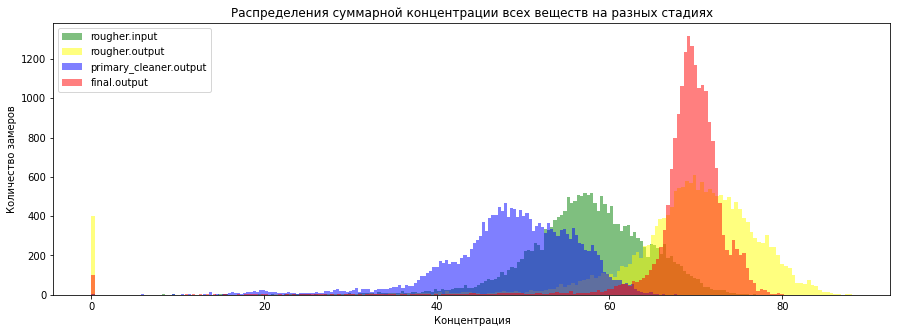

In [27]:
# Отобразим гистограммы концентрации всех веществ на различных этапах
data1 = total_concentration['rougher.input']
data2 = total_concentration['rougher.output']
data3 = total_concentration['primary_cleaner.output']
data4 = total_concentration['final.output']

plt.rcParams['figure.figsize'] = (15, 5)
plt.hist(data1, bins=200, color='green', label='rougher.input', alpha=0.5)
plt.hist(data2, bins=200, color='yellow', label='rougher.output', alpha=0.5)
plt.hist(data3, bins=200, color='blue', label='primary_cleaner.output', alpha=0.5)
plt.hist(data4, bins=200, color='red', label='final.output', alpha=0.5)
plt.legend(loc='upper left')
plt.title('Распределения суммарной концентрации всех веществ на разных стадиях')
plt.xlabel("Концентрация")
plt.ylabel("Количество замеров")
plt.show()

Видим что:

- есть выброс у нуля. Возможно, это ошибочные данные или данные не содержащих никаких нужных веществ заборов руды. Избавимся от них.
- на этапе final.output концентрация веществ сгруппирована в отрезке 65-75

In [28]:
print(train.shape)
print(test.shape)
print(full.shape)

(14579, 55)
(4860, 55)
(19439, 87)


In [29]:
#аналогично удаляю из датафрейма train концентрации до 1:
train = train[(train['rougher.input.feed_ag'] >= 1) &
            (train['rougher.input.feed_pb'] >= 1) &
            (train['rougher.input.feed_sol'] >= 1) &
            (train['rougher.input.feed_au'] >= 1)]

In [30]:
#аналогично удаляю из датафрейма test концентрации до 1:
test = test[(test['rougher.input.feed_ag'] >= 1) &
            (test['rougher.input.feed_pb'] >= 1) &
            (test['rougher.input.feed_sol'] >= 1) &
            (test['rougher.input.feed_au'] >= 1)]

In [31]:
# Избавляемся от выбросов
full = full[(full['rougher.input.feed_ag'] >= 1) &
            (full['rougher.input.feed_pb'] >= 1) &
            (full['rougher.input.feed_sol'] >= 1) &
            (full['rougher.input.feed_au'] >= 1) &
            (full['rougher.output.concentrate_ag'] >= 1) &
            (full['rougher.output.concentrate_pb'] >= 1) &
            (full['rougher.output.concentrate_sol'] >= 1) &
            (full['rougher.output.concentrate_au'] >= 1) &
            (full['primary_cleaner.output.concentrate_ag'] >= 1) &
            (full['primary_cleaner.output.concentrate_pb'] >= 1) &
            (full['primary_cleaner.output.concentrate_sol'] >= 1) &
            (full['primary_cleaner.output.concentrate_au'] >= 1) &
            (full['final.output.concentrate_ag'] >= 1) &
            (full['final.output.concentrate_pb'] >= 1) &
            (full['final.output.concentrate_sol'] >= 1) &
            (full['final.output.concentrate_au'] >= 1)]

In [32]:
print(train.shape)
print(test.shape)
print(full.shape)

(14463, 55)
(4811, 55)
(17908, 87)


**Вывод**

- Концентрация Ag и Sol падает по мере прохождения по стадиям. 
- Концентрация Pb и Au растет от этапа к этапу.
- На этапе флотации размеры гранул сильно разнятся, но в то же время на этапе первичной очистки размеры гранул на обучающей и тестовой выборках очень близки.
- На этапе final.output распределение концентраций веществ расположено в промежутке 65-75.
- Выбросы удалены.

Завершены изучение и обработка данных. Можем приступать к построению модели.

## Модель

In [33]:
# Напишем функцию для рассчета метрики качества модели - sMAPE (Symmetric Mean Absolute Percentage Error)
def smape_func(target, predictions):
    return 100/len(target) * np.sum(2 * np.abs(predictions - target) / (np.abs(target) + np.abs(predictions)))

In [34]:
# Напишем функцию для рассчета итогового sMAPE
def final_smape_func(rougher_target, final_target, rougher_predict, final_predict):
#  Расчитаем значение метрик для этапа флотации и после всех этапов отдельно   
    rougher_metric = smape_func(rougher_target, rougher_predict)
    final_metric = smape_func(final_target, final_predict)
    return 0.25 * rougher_metric + 0.75 * final_metric

In [35]:
# Cоздадим список столбцов свойственнй для флотации
rougher_features_list = ['rougher.input.feed_ag', 'rougher.input.feed_pb', 'rougher.input.feed_rate',
                         'rougher.input.feed_size', 'rougher.input.feed_sol', 'rougher.input.feed_au',
                         'rougher.input.floatbank10_sulfate', 'rougher.input.floatbank10_xanthate',
                         'rougher.input.floatbank11_sulfate', 'rougher.input.floatbank11_xanthate',
                         'rougher.state.floatbank10_a_air', 'rougher.state.floatbank10_a_level',
                         'rougher.state.floatbank10_b_air', 'rougher.state.floatbank10_b_level',
                         'rougher.state.floatbank10_c_air', 'rougher.state.floatbank10_c_level', 
                         'rougher.state.floatbank10_d_air', 'rougher.state.floatbank10_d_level',
                         'rougher.state.floatbank10_e_air', 'rougher.state.floatbank10_e_level',
                         'rougher.state.floatbank10_f_air', 'rougher.state.floatbank10_f_level']

In [36]:
rougher_features = train[rougher_features_list]
final_features = train.drop(['date', 'rougher.output.recovery', 'final.output.recovery'], axis=1)
rougher_target = train['rougher.output.recovery']
final_target = train['final.output.recovery']

In [37]:
# Создадим счетчик с параметром great_is_better
counter = make_scorer(smape_func, greater_is_better=False)

**В данном исследовании попробуем следующие модели: Линейная регрессия, Дерево решиний, Рандомный лес**

In [38]:
# Линейная регрессия
pipe = Pipeline([
    ('scale', StandardScaler()),
    ('regression', LinearRegression())
])

lr_rougher = cross_val_score(pipe, rougher_features, rougher_target, scoring=counter, cv=7)
lr_final = cross_val_score(pipe, final_features, final_target, scoring=counter, cv=7)

print('sMAPE для rougher:', lr_rougher.mean())
print('sMAPE для final:', lr_final.mean())

sMAPE для rougher: -13.388128470379744
sMAPE для final: -10.793977968695428


In [39]:
state = np.random.RandomState(12345)

In [40]:
# Дерево решений
dt_params={'max_depth':list(np.arange(2, 10, step=2)) + [None],
              'max_features':np.arange(2, 10, step=2)
         }

# Для наглядности происходящего процесса добавим tqdm в цикле
for _ in tqdm_notebook(range(1)):
    dt_regressor = DecisionTreeRegressor(random_state=state)

    dt_grid_search = GridSearchCV(dt_regressor, dt_params, scoring=counter, cv=7)

    dt_rougher = dt_grid_search.fit(rougher_features, rougher_target)
    print('Лучшие параметры для модели для rougher:', dt_rougher.best_params_)
    print('sMAPE для rougher:', dt_rougher.best_score_)

    dt_final = dt_grid_search.fit(final_features, final_target)
    print('Лучшие параметры для модели для final:', dt_final.best_params_)
    print('sMAPE для final:', dt_final.best_score_)

  0%|          | 0/1 [00:00<?, ?it/s]

Лучшие параметры для модели для rougher: {'max_depth': 2, 'max_features': 2}
sMAPE для rougher: -12.297882752808833
Лучшие параметры для модели для final: {'max_depth': 4, 'max_features': 4}
sMAPE для final: -11.119982769215591


Для сокращения времени обработки вариантов возьмем лишь 3 варианта n_estimators (на предварительных испытаниях установлено, что это 20 и 60, но добавим ешё и цифру 80 для наглядности). Также разделим вывод результатов для rougher и final в отдельные ячейки, иначе придется очень долго ждать хоть какой-то результат. Но даже в этом случае имейте ввиду, что каждая фаза займёт у вас почти по 6 минут.

In [41]:
# Случайный лес
rf_params = {
    'n_estimators': [20, 60, 80],
    'max_depth': [8, 10, 12],
    'max_features': [3, 4, 8]
}

# Для наглядности происходящего процесса добавим tqdm в цикле
for _ in tqdm_notebook(range(1)):
    rf_regressor = RandomForestRegressor(random_state=state)
    rf_grid_search = GridSearchCV(rf_regressor, rf_params, scoring=counter, cv=7, n_jobs=-1)

    rf_rougher = rf_grid_search.fit(rougher_features, rougher_target)
    print('Лучшие параметры для модели для rougher:', rf_rougher.best_params_)
    print('sMAPE для rougher:', rf_rougher.best_score_)

  0%|          | 0/1 [00:00<?, ?it/s]

Лучшие параметры для модели для rougher: {'max_depth': 8, 'max_features': 3, 'n_estimators': 80}
sMAPE для rougher: -12.476245122865324


In [42]:
for _ in tqdm_notebook(range(1)):
    rf_regressor = RandomForestRegressor(random_state=state)
    rf_grid_search = GridSearchCV(rf_regressor, rf_params, scoring=counter, cv=7, n_jobs=-1)

    rf_final = rf_grid_search.fit(final_features, final_target)
    print('Лучшие параметры для модели для final:', rf_final.best_params_)
    print('sMAPE для final:', rf_final.best_score_)

  0%|          | 0/1 [00:00<?, ?it/s]

Лучшие параметры для модели для final: {'max_depth': 8, 'max_features': 8, 'n_estimators': 80}
sMAPE для final: -10.125890438842529


In [43]:
# Модель RandomForest показала лучший результат c такими параметрами
rougher_rf = RandomForestRegressor(max_depth=12, max_features=8, n_estimators=60, random_state=state)
final_rf = RandomForestRegressor(max_depth=12, max_features=8, n_estimators=20, random_state=state)

rougher_rf.fit(rougher_features, rougher_target)
final_rf.fit(final_features, final_target);

In [44]:
# Пазделим тестовые данные на признаки
test_rougher_features = test[rougher_features_list]
test_final_features = test.drop(['date', 'rougher.output.recovery', 'final.output.recovery'], axis=1)
test_rougher_target = test['rougher.output.recovery']
test_final_target = test['final.output.recovery']

In [45]:
# Для проверки адекватности нашей модели создадим константную модель
for strategy in ['mean', 'median']:
    dummy_rougher = DummyRegressor(strategy=strategy)
    dummy_final = DummyRegressor(strategy=strategy)

    dummy_rougher.fit(rougher_features, rougher_target)
    dummy_final.fit(final_features, final_target)

    dummy_predict_rougher = dummy_rougher.predict(test_rougher_features)
    dummy_predict_final = dummy_final.predict(test_final_features)

    dummy_smape = final_smape_func(test_rougher_target, test_final_target, dummy_predict_rougher, dummy_predict_final)
    print(f'Для итоговой стратегии {strategy} sMAPE для константной модели = {dummy_smape}')

Для итоговой стратегии mean sMAPE для константной модели = 8.768528775704068
Для итоговой стратегии median sMAPE для константной модели = 8.268629986144969


In [46]:
# Построим предсказания нашей модели и рассчитаем итоговую sMAPE
rougher_predictions_rf = rougher_rf.predict(test_rougher_features)
final_predictions_rf = final_rf.predict(test_final_features)

final_score = final_smape_func(test_rougher_target, test_final_target, rougher_predictions_rf, final_predictions_rf)
print(f'Итоговое sMAPE для модели RandomForest = {final_score}')

Итоговое sMAPE для модели RandomForest = 6.264125475978981


Обученная модель предсказывает результат точнее константной. Это говорит о том, что построенная модель адекватна.

**Вывод**

- Написали функции для рассчета sMAPE и итогового sMAPE.
- Проверили несколько формул кросс-валидацией для разных моделей (Линейная регрессия; Решающее дерево;Рандомный лес).
- Проверили работу итовой выбранной модели на тестовой выборке с помощью метрики качества sMAPE и сравнили её с константной моделью.
- Убедились, что лучший вариант в нашем случае - это RandomForest 

## Итоговый вывод

Основная цель проекта достигнута - подготовлен прототив лучшей модели машинного обучения для «Цифры» - RandomForestRegressor, так как эта модель предсказывает коэффициент восстановления золота из золотосодержащей руды наилучшим образом, в том числе при проверке на вменяемость.
Лучшие параметры:
- Для процесса флотации - Рандомный лес размером 60, с глубиной дерева 12, учитывающий значения 8 признаков.
- Для оценки после вторичной очистки - Рандомный лес размером 20, с глубиной дерева 12, учитывающий значения 8 признаков.

Выбранная стратегия выполнения исследования позволила получить значение метрики sMAPE = 6.264, что на 2.004 процентных пункта лучше константный модели (sMAPE = 8.268). Это показывает, что наша модель адекватна и применима в данном случае.

**Выполнены следующие этапы:**

- Файл открыт, данные загружены.
- Во всех таблицах есть пропуски.
- За исключением столбца date, все признаки имеют тип float.
- Дубликатов не обнаружено.
- Типы данных не требуют преобразования.
- Информация о выходных значениях, которая отсутствует в test, присутсвует в full, поэтому возможно тестовые данные были предобработаны до предоставления нам.
- Целевые признаки - rougher.output.recovery и final.output.recovery.
- Количество строк в train и test в сумме дают размер full, поэтому вероятно полный датафрейм был разделен на них на этапе выгрузки данных.
- Параметры указывающие объём воздуха, уровень жидкости, размер гранул сырья, скорость подачи на разных этапах имеют диапазоны значений измеряемые сотнями и тысячами едениц. Еденицы других параметров измеряются еденицами и десятками.
- Распределение признаков разнообразно, все они, кроме столбца date, являются количественными.
- Целевые признаки имеют отрицательную асимметрию и не следуют какому-либо стандартному закону.
- Корреляционный анализ показал, что между некоторыми признаками существует сильная зависимость, связанная с концентрациями металлов в руде, применением реагентов и последовательными технологическими процессами.
- Значение метрики МАЕ рассчитаное на данных полного датафрейма стремится к нулю, что говорит об использовании правильной формулы для расчёта эффективности обогащения
- Пропуски в данных заменены ближайщими предыдущими значениями.

**Выявлено что:**

- Концентрация Ag и Sol падает по мере прохождения по стадиям.
- Концентрация Pb и Au растет от этапа к этапу.
- На этапе флотации размеры гранул сильно разнятся, но в то же время на этапе первичной очистки размеры гранул на обучающей и тестовой выборках очень близки.
- На этапе final.output распределение концентраций веществ расположено в промежутке 65-75.

**А также мы:**
- Удалили выбросы.
- Написали функции для рассчета sMAPE и итогового sMAPE.
- Проверили несколько формул кросс-валидацией для разных моделей (Линейная регрессия; Решающее дерево;Рандомный лес).
- Проверили работу итовой выбранной модели на тестовой выборке с помощью метрики качества sMAPE и сравнили её с константной моделью.
- Убедились, что лучший вариант в нашем случае - это RandomForest

<div style="border:solid Chocolate 2px; padding: 40px">


<h2> Дополнительные комментарии по проекту <a class="tocSkip"> </h2>    
    
Чтобы лучше разобраться в ML, можно посмотреть: 
    
- Открытый курс машинного обучения: https://habr.com/ru/company/ods/blog/322626/   
    
- Книжка от ШАД: https://academy.yandex.ru/handbook/ml/
    
- Лекции от Andrew Ng: https://www.youtube.com/watch?v=PPLop4L2eGk&list=PLLssT5z_DsK-h9vYZkQkYNWcItqhlRJLN
- Избежать утечки данных при кросс-валидации поможет <a href="https://towardsdatascience.com/pipeline-columntransformer-and-featureunion-explained-f5491f815f">конвеерная обработка данных</a>.     
    
- Не все признаки приносят пользу при моделировании. Инструмент <a href="https://proglib.io/p/feature-selector">FeatureSelector</a> поможет отобрать важные признаки и избавит от ручной обработки.  Также есть статья на <a href="https://www.kaggle.com/code/prashant111/comprehensive-guide-on-feature-selection/notebook">Kaggle</a> (она сложнее).    
    
    
В этом проекте были отработаны несколько моментов. А самый очевидный: заметно, что разность метрик качества (константной и нашей модели) -  не слишком большая. Такое расхождение метрик допустимо в этом проекте. Что тогда  для дальнейшего улучшения качества моделирования возможно тут пересмотреть?
Например:
1. Качество данных на входе модели машинного обучения: повторно оценить аномалии, пропуски, соответствие законам химии и физики, все ли правдоподобно?
2. Работа с моделями машинного обучения:
- Создание новых признаков для моделей, Features Engineering: возможно стоит обратиться к технологу производства и ещё раз пробежаться по бизнес-цепочке процесса.
- Отбор самих моделей машинного обучения и гиперпараметров.
    
3. Параметры производственного процесса, к примеру: температура сырья, скорость ленточного конвейера, и.т.п.
    

Если провести Анализ измерительных систем, или MSA, то можно разобраться в причинах неточности полученных с производства данных. Статистический анализ данных, или SPC, - тоже будет являться незаменимым помощником в решении нашей задачи.

    
Также можно посмотреть статью, которая рассматривает разные способы обработки пропусков, выделяет их плюсы и минусы, думаю, тебе может быть интересно: https://loginom.ru/blog/missing
    
</div>

## Чек-лист готовности проекта

- [x]  Jupyter Notebook открыт
- [x]  Весь код выполняется без ошибок
- [x]  Ячейки с кодом расположены в порядке выполнения
- [x]  Выполнен шаг 1: данные подготовлены
    - [x]  Проверена формула вычисления эффективности обогащения
    - [x]  Проанализированы признаки, недоступные в тестовой выборке
    - [x]  Проведена предобработка данных
- [x]  Выполнен шаг 2: данные проанализированы
    - [x]  Исследовано изменение концентрации элементов на каждом этапе
    - [x]  Проанализированы распределения размеров гранул на обучающей и тестовой выборках
    - [x]  Исследованы суммарные концентрации
- [x]  Выполнен шаг 3: построена модель прогнозирования
    - [x]  Написана функция для вычисления итогового *sMAPE*
    - [x]  Обучено и проверено несколько моделей
    - [x]  Выбрана лучшая модель, её качество проверено на тестовой выборке